In [ ]:
# Instalamos ultralytics
!pip install ultralytics==8.0.20

# importamos el módulo display del paquete IPython para controlar la salida
from IPython import display

# limpia la salida del área de visualización actual
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 29.1/201.2 GB disk)


In [ ]:
# Instalamos kaggle. Utilizamos -q para que reduzca la cantidad de texto al instalar
!pip install -q kaggle

# Importa la función 'files' del módulo 'google.colab'.
from google.colab import files

# Función para cargar archivos a Colab desde local
files.upload()

# Crea un directorio en el home para almacenar el archivo JSON de kaggle
!mkdir ~/.kaggle

# Copia el archivo kaggle.json, necesario para las credenciales de kaggle
!cp kaggle.json ~/.kaggle/

# Cambia los permisos del archivo JSON para que solo el usuario pueda utilizarlos
!chmod 600 ~/.kaggle/

# Muestra una lista de datasets disponibles en kaggle
!kaggle datasets list

Saving kaggle.json to kaggle.json
401 - Unauthorized - Unauthenticated


In [ ]:
# Descarga el dataset
!kaggle datasets download -d alkanerturan/vehicledetection

 91% 57.0M/62.8M [00:00<00:00, 116MB/s] 
100% 62.8M/62.8M [00:00<00:00, 116MB/s]


In [ ]:
import zipfile
import os

# Ruta del archivo zip
archivo_zip = '/content/vehicledetection.zip'

# Directorio de extracción
directorio_extraccion = '/content/'

# Extraer el archivo zip
with zipfile.ZipFile(archivo_zip, 'r') as zip_ref:
    zip_ref.extractall(directorio_extraccion)

# Lista los archivos extraídos
archivos_extraidos = os.listdir(directorio_extraccion)

In [ ]:
# Importa la clase YOLO desde el paquete ultralytics
from ultralytics import YOLO

# Importa la función glob del módulo glob. Busca los nombres que coinciden con
# un patrón específico
from glob import glob

# Función para crear directorios
def make_ds(root, path_to_copy):
  # Crea un directorio en path_to_copy. Si ya existe, no devuelve error
  os.makedirs(path_to_copy, exist_ok = True)
  # Lista los archivos
  files = glob(f"{root}/*")
  # Recorre la lista de archivos
  for idx, file in enumerate(files):
    # Si es un directorio lo copia a path_to_copy
    if os.path.isdir(file):
      os.system(f"cp -r {file} {path_to_copy}")
    # Si es un archivo, lo copia a path_to_copy
    elif os.path.isfile(file):
      os.system(f"cp {file} {path_to_copy}")

# Define la ruta del directorio
root = "/content/VehiclesDetectionDataset"

# Llama a la función y le pasa la ruta donde están y dónde los tiene que copiar
make_ds(root = root, path_to_copy = "/content/")

In [ ]:
# Utilizamos yolo en modo train para entrenar el modelo
# !yolo task=detect mode=train model=yolov8s.pt data="/content/dataset.yaml" epochs=40 imgsz=640 plots=True

!yolo task=detect mode=train model=yolov8s.pt data="https://s3.eu-north-1.amazonaws.com/woztell-files/61dd440160b7ca080e173c57/dataset.yaml" epochs=50 imgsz=640 plots=True project='runs'

# Carga la extensión de TensorBoard
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

## Evaluation

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

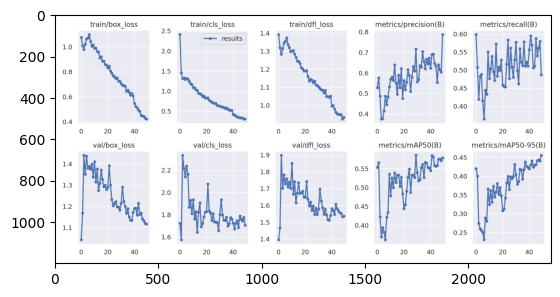

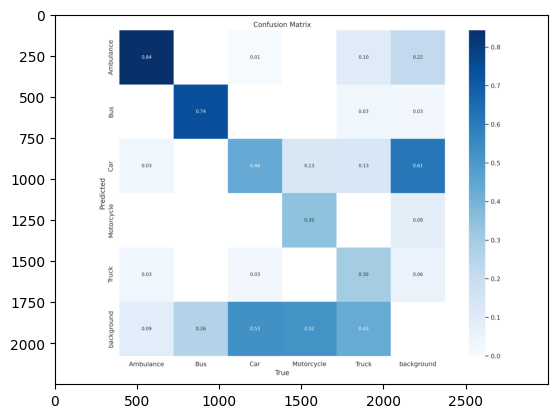

"\nLos elementos diagonales muestran el porcentaje de clasificaciones correctas \npara cada clase: por ejemplo, el modelo clasificó correctamente el 84% de las \nambulancias y el 74% de los autobuses.\n\nLos elementos no diagonales muestran confusiones entre clases:\n1. El 0.03 de las ambulancias fueron incorrectamente clasificadas como autobuses.\n2. El 0.26 de los autobuses fueron incorrectamente clasificados como 'background'\n\nLa barra de color a la derecha indica la escala de los valores: cuanto más \noscuro es el azul, mayor es la proporción de las predicciones para esa celda \nen particular. Los valores van de 0 a 0.8 en esta matriz, lo que significa que \nninguna clase fue clasificada correctamente o incorrectamente en más del 80% \nde los casos.\n"

In [ ]:
img = mpimg.imread('/content/runs/train3/results.png')
imgplot = plt.imshow(img)
plt.show()

'''
Pérdidas:

1. Viendo train/box_loss y val/box_loss (que son las pérdidas de las boxes),
vemos que el loss de ambos disminuye de manera constante, lo que indica
que generalizan bien. Además, la convergencia de ambas parece indicar
que no hay un sobreajuste significativo

2. train/cls_loss y val/cls_loss representan las pérdidas de clasificación
Al mostrar una tendencia descendente en train y val, implica que el modelo
mejora en la asignación de la clase correcta a los objetos que detecta

3. train/obj_loss y val/obj_loss indican la pérdida de confianza del objeto.
Como disminuyen con el tiempo, indican un buen aprendizaje

Métricas de rendimiento:

1. metrics/precision(B). Muchas fluctuaciones pero tendencia ascendente.
Indica que el modelo se vuelve más preciso en las predicciones a medida
que entrena.

2. metrics/recall(B). Tendencia general al alza. El modelo es capaz de detectar
una proporción creciente de objetos positivos reales a medida que pasa
el tiempo.

3. metrics/mAP50(B). El mAP con IoU (Intersection over Union) de 0.5 es excelente,
ya que el modelo es más preciso al predecir la localización y clasificación
correcta de los objetos.

4. metrics/mAP50-95(B). Aumento constante que sugiere que el modelo es robusto
en varios niveles de exigencia en cuanto a la precisión de las cajas
delimitadoras.
'''

img = mpimg.imread('/content/runs/train3/confusion_matrix.png')
imgplot = plt.imshow(img)
plt.show()

'''
Los elementos diagonales muestran el porcentaje de clasificaciones correctas
para cada clase: por ejemplo, el modelo clasificó correctamente el 84% de las
ambulancias y el 74% de los autobuses.

Los elementos no diagonales muestran confusiones entre clases:
1. El 0.03 de las ambulancias fueron incorrectamente clasificadas como autobuses.
2. El 0.26 de los autobuses fueron incorrectamente clasificados como 'background'

La barra de color a la derecha indica la escala de los valores: cuanto más
oscuro es el azul, mayor es la proporción de las predicciones para esa celda
en particular. Los valores van de 0 a 0.8 en esta matriz, lo que significa que
ninguna clase fue clasificada correctamente o incorrectamente en más del 80%
de los casos.
'''

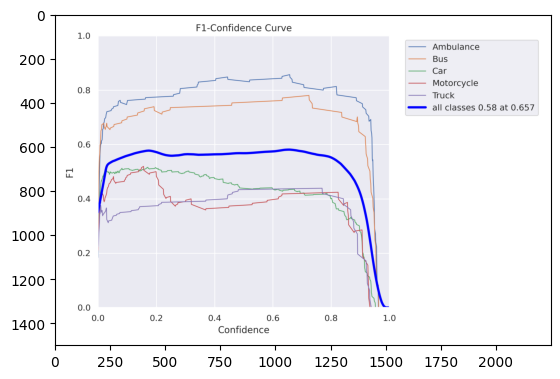

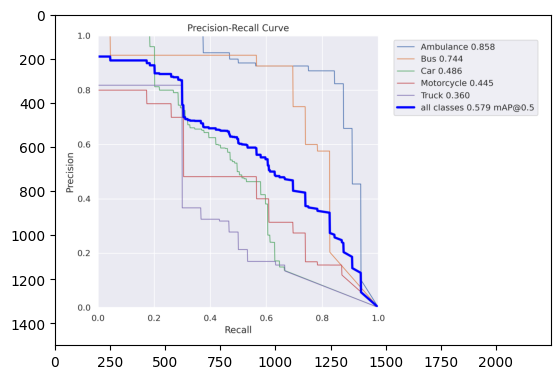

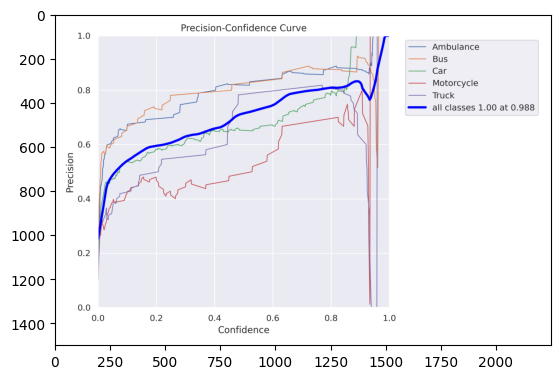

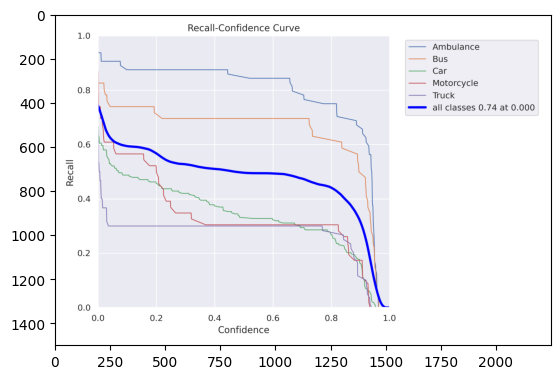

In [ ]:
img = mpimg.imread('/content/runs/train3/F1_curve.png')
imgplot = plt.imshow(img)
plt.show()

'''La curva F1 es una medida de la precisión de un test y es el promedio
de la precisión y el recall. El eje horizontal (Confidence) muestra el umbral
de confianza, que es un valor entre 0 y 1 que indica la certeza del modelo en
sus predicciones. El eje vertical (F1) muestra el valor de la puntuación F1,
que también está entre 0 y 1, donde 1 es perfecto y 0 es la peor puntuación.

La línea titulada "all classes" muestra la puntuación F1 agregada de todas
las clases a diferentes niveles de confianza. Esta línea alcanza un pico,
indicado por la anotación "all classes 0.58 at 0.657", lo que significa que
la puntuación F1 agregada para todas las clases es máxima (0.58) cuando el
umbral de confianza es de aproximadamente 0.657.

Podemos ver que la puntuación F1 para "Ambulance" (en azul claro) generalmente
aumenta con el umbral de confianza, lo que significa que al ser más estrictos
en la confianza de las predicciones, la precisión y el recall de las ambulancias
mejoran.

Si se quiere priorizar la precisión en la clasificación de "Motorcycles", se
puede elegir un umbral de confianza que maximice la puntuación F1 para esa clase.

Las caídas pronunciadas en todas las curvas cerca del extremo derecho sugieren
que el modelo tiene poca confianza en muchas de sus predicciones correctas, lo
que indica que podría haber un margen de mejora en la calibración del modelo.
'''

img = mpimg.imread('/content/runs/train3/PR_curve.png')
imgplot = plt.imshow(img)
plt.show()

'''
Esta imagen es una curva de Precisión-Recall (PR) que evalúa la calidad de
las predicciones de un clasificador en cuanto a cómo maneja diferentes clases
(Ambulance, Bus, Car, Motorcycle, Truck) y todas las clases combinadas (all
classes).

El eje x (Recall) muestra la proporción de resultados positivos reales que
fueron identificados correctamente por el modelo (es decir, la sensibilidad
del modelo).
El eje y (Precisión) muestra la proporción de identificaciones positivas que
fueron realmente correctas.

Las líneas más cercanas a la esquina superior derecha indican un mejor
rendimiento. Por ejemplo, la línea de "Ambulance" tiene el área bajo la curva
más alta, lo que significa que, en comparación con las otras clases, las
ambulancias tienen un equilibrio más favorable entre la precisión y el recall.

La línea titulada "all classes 0.579 mAP@0.5" muestra el promedio del área bajo
la curva de Precisión-Recall (mAP) para todas las clases a un umbral de IoU
(Intersección sobre Unión) de 0.5. Un mAP más alto indica un mejor rendimiento
general del modelo a través de todas las clases. Aquí, el valor es 0.579, que
es menos de 60%, sugiriendo que hay margen de mejora para este clasificador.

el clasificador realiza un mejor trabajo al identificar ambulancias y autobuses
que al identificar coches, motocicletas y camiones. Los vehículos como 'Car',
'Motorcycle' y 'Truck' tienen menor precisión y recall, lo que podría ser un
área de enfoque para mejorar el modelo.
'''

img = mpimg.imread('/content/runs/train3/P_curve.png')
imgplot = plt.imshow(img)
plt.show()

img = mpimg.imread('/content/runs/train3/R_curve.png')
imgplot = plt.imshow(img)
plt.show()

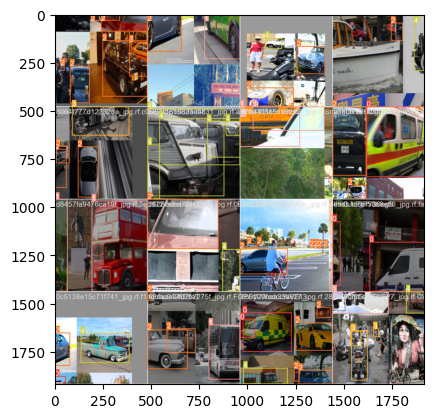

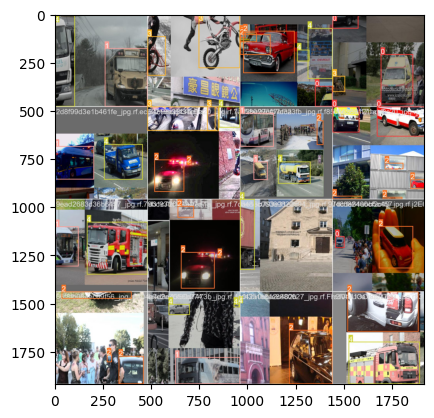

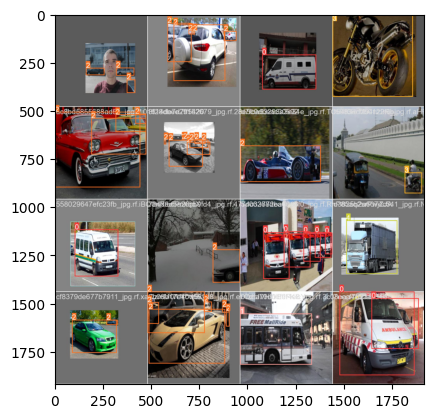

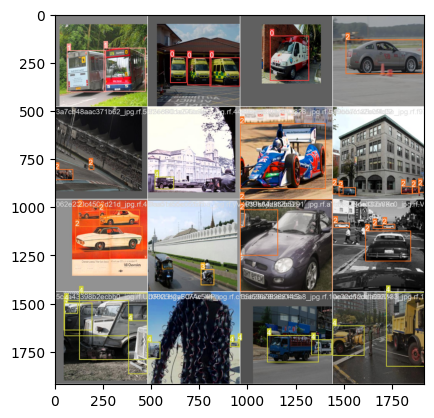

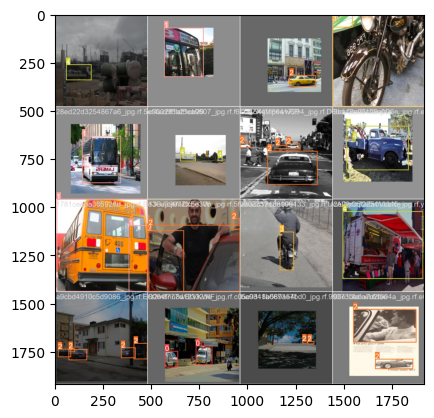

In [ ]:
img = mpimg.imread('/content/runs/train3/train_batch0.jpg')
imgplot = plt.imshow(img)
plt.show()

img = mpimg.imread('/content/runs/train3/train_batch1.jpg')
imgplot = plt.imshow(img)
plt.show()

img = mpimg.imread('/content/runs/train3/train_batch2200.jpg')
imgplot = plt.imshow(img)
plt.show()

img = mpimg.imread('/content/runs/train3/train_batch2201.jpg')
imgplot = plt.imshow(img)
plt.show()

img = mpimg.imread('/content/runs/train3/train_batch2202.jpg')
imgplot = plt.imshow(img)
plt.show()

## Image inference

In [ ]:
# Se utiliza yolo para detección en imágenes, utilizando los mejores pesos
# generados durante el entrenamiento, en modo predicción. Además, se configura
# que el umbral de confianza sea del 40%
!yolo task=detect mode=predict model="/content/runs/train3/weights/best.pt" conf = 0.4 source = "/content/VehiclesDetectionDataset/test/images" save = True

2024-04-21 19:05:29.092598: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-21 19:05:29.092650: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-21 19:05:29.093830: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-04-21 19:05:30.124759: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11127519 parameters, 0 gradients, 28.4 GFLOPs
image 1/126 /content/VehiclesDetectionDataset/test/images/00dea1edf14f09a

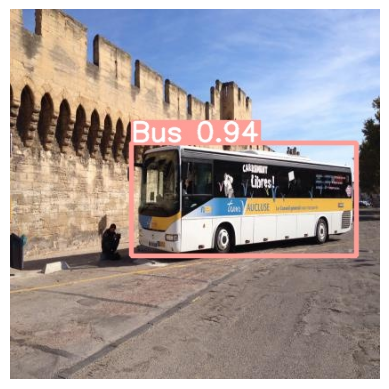

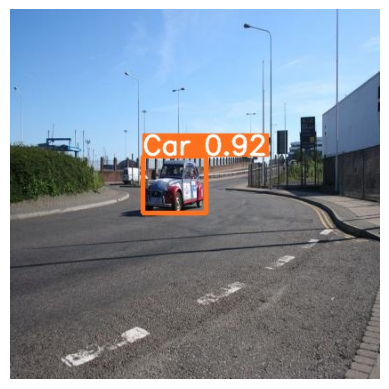

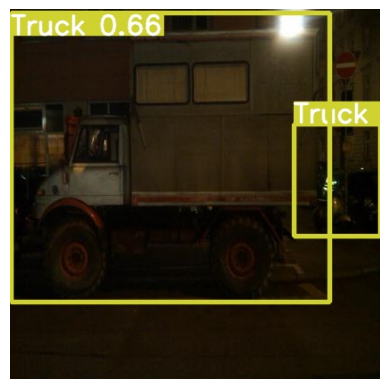

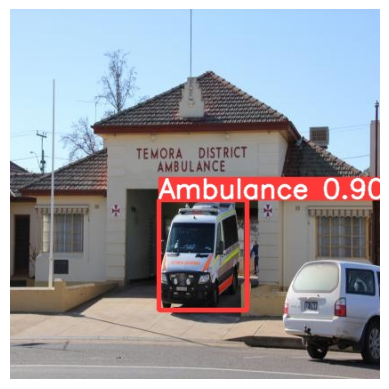

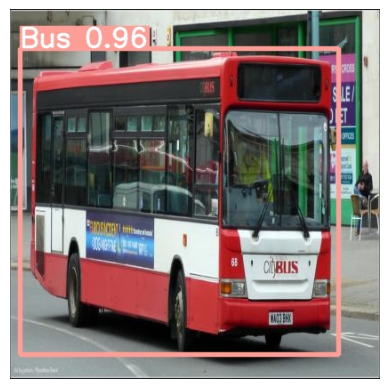

In [ ]:
# Con glob buscar todos los nombres de archivos que coinciden con un patrón
from glob import glob
# PIL se usa para manejar imágenes
from PIL import Image
from matplotlib import pyplot as plt

# Utilizamos glob para obtener una lista de todos los archivos .jpg en la carpeta especificada.
# Sólo seleccionamos los primeros 5 archivos usando [:5] al final de la llamada.
for image_path in glob(f'/content/runs/detect/predict/*.jpg')[:5]:
      # Abrimos la imagen en la ruta especificada y la mostramos en un gráfico.
      plt.imshow(Image.open(image_path));
      # Ocultamos los ejes del gráfico
      plt.axis("off");
      # Mostramos la imagen
      plt.show()
      print("\n")


## Video inference

In [ ]:
!yolo detect predict model="/content/runs/train3/weights/best.pt" source="/content/TestVideo/TrafficPolice.mp4" save=True

2024-04-21 19:06:10.413109: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-21 19:06:10.413162: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-21 19:06:10.414895: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-04-21 19:06:11.682458: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11127519 parameters, 0 gradients, 28.4 GFLOPs
video 1/1 (1/2362) /content/TestVideo/TrafficPolice.mp4: 384x640 8 Cars, 